<h1> Training <code>`color_saturation`</code> </h1>

## Setup 

**Labels:**
* shot_location_exterior_nature_beach
* shot_location_exterior_nature_canyon
* shot_location_exterior_nature_cave
* shot_location_exterior_nature_desert
* shot_location_exterior_nature_forest
* shot_location_exterior_nature_glacier
* shot_location_exterior_nature_lake
* shot_location_exterior_nature_mountains
* shot_location_exterior_nature_ocean
* shot_location_exterior_nature_plains
* shot_location_exterior_nature_polar
* shot_location_exterior_nature_river
* shot_location_exterior_nature_sky
* shot_location_exterior_nature_space
* shot_location_exterior_nature_wetlands
* shot_location_exterior_settlement_city
* shot_location_exterior_settlement_suburb
* shot_location_exterior_settlement_town
* shot_location_exterior_structure_bridge
* shot_location_exterior_structure_building_airport
* shot_location_exterior_structure_building_auto_body
* shot_location_exterior_structure_building_castle
* shot_location_exterior_structure_building_hospital
* shot_location_exterior_structure_building_houseofworship
* shot_location_exterior_structure_building_library
* shot_location_exterior_structure_building_mall
* shot_location_exterior_structure_building_office
* shot_location_exterior_structure_building_residence_apartment
* shot_location_exterior_structure_building_residence_house
* shot_location_exterior_structure_building_residence_mansion
* shot_location_exterior_structure_building_residence_monastery
* shot_location_exterior_structure_building_residence_palace
* shot_location_exterior_structure_building_restaurant
* shot_location_exterior_structure_building_school
* shot_location_exterior_structure_building_skyscraper
* shot_location_exterior_structure_building_stadium
* shot_location_exterior_structure_building_station_gas
* shot_location_exterior_structure_building_station_subway
* shot_location_exterior_structure_building_station_train
* shot_location_exterior_structure_building_store
* shot_location_exterior_structure_building_theater
* shot_location_exterior_structure_building_warehouse
* shot_location_exterior_structure_bus_stop
* shot_location_exterior_structure_farm
* shot_location_exterior_structure_industrial
* shot_location_exterior_structure_park
* shot_location_exterior_structure_parkinglot
* shot_location_exterior_structure_pier
* shot_location_exterior_structure_playground
* shot_location_exterior_structure_port
* shot_location_exterior_structure_road
* shot_location_exterior_structure_ruins
* shot_location_exterior_structure_sidewalk
* shot_location_exterior_structure_tunnel
* shot_location_exterior_structure_vehicle_airplane
* shot_location_exterior_structure_vehicle_bicycle
* shot_location_exterior_structure_vehicle_boat
* shot_location_exterior_structure_vehicle_bus
* shot_location_exterior_structure_vehicle_car
* shot_location_exterior_structure_vehicle_helicopter
* shot_location_exterior_structure_vehicle_motorcycle
* shot_location_exterior_structure_vehicle_spacecraft
* shot_location_exterior_structure_vehicle_train
* shot_location_exterior_structure_vehicle_truck
* shot_location_interior_nature_cave
* shot_location_interior_structure_building_airport
* shot_location_interior_structure_building_arena
* shot_location_interior_structure_building_auditorium
* shot_location_interior_structure_building_auto_repair_shop
* shot_location_interior_structure_building_bar
* shot_location_interior_structure_building_barn
* shot_location_interior_structure_building_cafe
* shot_location_interior_structure_building_cafeteria
* shot_location_interior_structure_building_command_center
* shot_location_interior_structure_building_crypt
* shot_location_interior_structure_building_dancefloor
* shot_location_interior_structure_building_dungeon
* shot_location_interior_structure_building_elevator
* shot_location_interior_structure_building_factory
* shot_location_interior_structure_building_foyer
* shot_location_interior_structure_building_gym
* shot_location_interior_structure_building_hallway
* shot_location_interior_structure_building_hospital
* shot_location_interior_structure_building_houseofworship
* shot_location_interior_structure_building_lobby
* shot_location_interior_structure_building_mall
* shot_location_interior_structure_building_office
* shot_location_interior_structure_building_office_cubicle
* shot_location_interior_structure_building_open_office
* shot_location_interior_structure_building_prison
* shot_location_interior_structure_building_restaurant
* shot_location_interior_structure_building_room_bath
* shot_location_interior_structure_building_room_bed
* shot_location_interior_structure_building_room_class
* shot_location_interior_structure_building_room_closet
* shot_location_interior_structure_building_room_conference
* shot_location_interior_structure_building_room_court
* shot_location_interior_structure_building_room_dining
* shot_location_interior_structure_building_room_kitchen
* shot_location_interior_structure_building_room_kitchen_commercial
* shot_location_interior_structure_building_room_living
* shot_location_interior_structure_building_room_study
* shot_location_interior_structure_building_room_throne
* shot_location_interior_structure_building_stage
* shot_location_interior_structure_building_stairwell
* shot_location_interior_structure_building_station_bus
* shot_location_interior_structure_building_station_fire
* shot_location_interior_structure_building_station_police
* shot_location_interior_structure_building_station_subway
* shot_location_interior_structure_building_station_train
* shot_location_interior_structure_building_store
* shot_location_interior_structure_building_store_aisle
* shot_location_interior_structure_building_store_checkout
* shot_location_interior_structure_building_warehouse
* shot_location_interior_structure_vehicle_airplane_cabin
* shot_location_interior_structure_vehicle_airplane_cockpit
* shot_location_interior_structure_vehicle_boat
* shot_location_interior_structure_vehicle_bus
* shot_location_interior_structure_vehicle_car
* shot_location_interior_structure_vehicle_helicopter
* shot_location_interior_structure_vehicle_spacecraft
* shot_location_interior_structure_vehicle_subway
* shot_location_interior_structure_vehicle_train
* shot_location_interior_structure_vehicle_truck

We only want to do transfer learning i.e. create a new head and train that alone, because we need the body to remain the same across different categories aka. MobileNetV2 pretrained on ImageNet

In [1]:
# Dynamically load package
%load_ext autoreload
%autoreload 2

# Display multiple outputs per cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [2]:
from fastai.vision import *
from fastai.callbacks import *
from ranger import Ranger

from CinemaNet.convert import *
from CinemaNet.blend import *
from CinemaNet.wandb import *
from CinemaNet.custom_head import *
from CinemaNet.train_utils import to_film_ar # other utils will be redefined for clarity

import wandb

In [3]:
model_name = 'cat_shot-location_MNetV2-224x224_tfr-lrn_ATTRIBUTES'

In [45]:
wandb.init(name    = f"{re.sub('cat_[a-z].*_MNet', 'MNet', model_name)}",
           project = 'shot_location',
           entity  = 'synopsis',
           resume  = True, id = '1u612b7k',
           reinit  = True)

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.8.25 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


W&B Run: https://app.wandb.ai/synopsis/shot_location/runs/1u612b7k

Streaming file created twice in same run: /home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200209_174107-1u612b7k/wandb-events.jsonl
Streaming file created twice in same run: /home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200209_174107-1u612b7k/wandb-history.jsonl


In [7]:
%env WANDB_NOTEBOOK_NAME='cat_shot-location.ipynb'

env: WANDB_NOTEBOOK_NAME='cat_shot-location.ipynb'


## Creating Train + Val Datasets

### Grabbing the shot-location data

In [4]:
path = Path('/home/rahul/datasets/Synopsis_Model_All_Concepts/shot_location/')

In [5]:
label_dirs = [f for f in os.listdir(path) if f.startswith('shot_location_')]
label_dirs.sort()
label_dirs[:4]

['shot_location_exterior_nature_beach',
 'shot_location_exterior_nature_canyon',
 'shot_location_exterior_nature_cave',
 'shot_location_exterior_nature_desert']

In [6]:
train_fnames = {}
valid_fnames = {}

for label in label_dirs:
    files    = get_files(path/label, presort=True)
    np.random.seed(42)
    np.random.shuffle(files)
    if len(files) < 250:
        valid_fnames[label] = files[:50]
        train_fnames[label] = files[50:]
    elif len(files) < 350:
        valid_fnames[label] = files[:75]
        train_fnames[label] = files[75:]
    else:
        valid_fnames[label] = files[:100]
        train_fnames[label] = files[:300]

In [7]:
fnames_train = sum(train_fnames.values(),[])
fnames_valid = sum(valid_fnames.values(),[])

print(f"# train images: {len(fnames_train)}")
print(f"# valid images: {len(fnames_valid)}")
print(f"# total images: {len(fnames_train) + len(fnames_valid)}")

# train images: 27162
# valid images: 9300
# total images: 36462


### Adding `NA`s

#### Extreme Close Ups

In [8]:
ecu_dir = Path('/home/rahul/github_projects/CinemaNet/train/Extreme Close-Up/')
ecus    = get_files(ecu_dir)
print(f"# extreme close up images: {len(ecus)}")

# extreme close up images: 784


In [9]:
fnames_valid = fnames_valid + ecus[:200]
fnames_train = fnames_train + ecus[200:]

In [10]:
print(f"# train images: {len(fnames_train)}")
print(f"# valid images: {len(fnames_valid)}")
print(f"# total images: {len(fnames_train) + len(fnames_valid)}")

# train images: 27746
# valid images: 9500
# total images: 37246


#### Textures

We need to recurse through the directory and grab a uniform-ish no. of images from each sub-texture

In [11]:
textures_dir = Path('/home/rahul/datasets/Synopsis_Model_All_Concepts/texture/')
textures     = get_files(textures_dir, recurse=True)
print(f"# texture images: {len(textures)}")

# texture images: 5518


In [12]:
textures_subdirs = [f for f in os.listdir(textures_dir) if f.startswith('texture_')]

texture_train_fnames = {}
texture_valid_fnames = {}

for label in textures_subdirs:
    files    = get_files(textures_dir/label, presort=True)
    np.random.seed(42)
    np.random.shuffle(files)
    if len(files) <= 120:
        texture_valid_fnames[label] = files[:35]
        texture_train_fnames[label] = files[35:]
    else:
        texture_valid_fnames[label] = files[:75]
        texture_train_fnames[label] = files[75:]

In [13]:
fnames_textures_train = sum(texture_train_fnames.values(),[])
fnames_textures_valid = sum(texture_valid_fnames.values(),[])

In [14]:
print(f"# texture train images: {len(fnames_textures_train)}")
print(f"# texture valid images: {len(fnames_textures_valid)}")

# texture train images: 3903
# texture valid images: 1615


In [15]:
fnames_valid = fnames_valid + fnames_textures_valid
fnames_train = fnames_train + fnames_textures_train

In [16]:
print(f"# train images: {len(fnames_train)}")
print(f"# valid images: {len(fnames_valid)}")
print(f"# total images: {len(fnames_train) + len(fnames_valid)}")

# train images: 31649
# valid images: 11115
# total images: 42764


### Collate into DataFrame

In [12]:
%%timeit

df = pd.DataFrame(columns=['filepath', 'tags'])

for i,f in enumerate(fnames_train[:100]):
    label = re.search('(?<=shot_location/shot_location_).*/', str(f)).group(0)
    label = label.split('/')[:-1][0] # remove '/'; get str, not list
    df.loc[i] = [f] + [label]
    

122 ms ± 1.15 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [13]:
%%timeit

row_list = []

for i,f in enumerate(fnames_train[:100]):
    label = re.search('(?<=shot_location/shot_location_).*/', str(f)).group(0)
    label = label.split('/')[:-1][0] # remove '/'; get str, not list
    rowdict = {}
    rowdict['filepath'] = str(f)
    rowdict['label'] = label
    row_list.append(rowdict)

df = pd.DataFrame(row_list)

710 µs ± 3.05 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


The dict method is clearly faster, so we use that to create our dataframe

In [17]:
row_list = []
for i,f in enumerate(fnames_train):
    rowdict = {}
    rowdict['filepath'] = str(f)
    label = re.search('(?<=shot_location/shot_location_).*/', str(f))
    if label:
        label = label.group(0).split('/')[:-1][0] # remove '/'; get str, not list
        rowdict['label'] = label
    else:
        rowdict['label'] = 'NA'
    #rowdict['filepath'] = re.search('(?<=shot_location/).*', str(f)).group(0)
    row_list.append(rowdict)
    
df_train = pd.DataFrame(row_list)


row_list = []
for i,f in enumerate(fnames_valid):
    rowdict = {}
    rowdict['filepath'] = str(f)
    label = re.search('(?<=shot_location/shot_location_).*/', str(f))
    if label:
        label = label.group(0).split('/')[:-1][0] # remove '/'; get str, not list
        rowdict['label'] = label
    else:
        rowdict['label'] = 'NA'
    #rowdict['filepath'] = re.search('(?<=shot_location/).*', str(f)).group(0)
    row_list.append(rowdict)

df_valid = pd.DataFrame(row_list)

In [18]:
lls = LabelLists(path  = '/',
                 train = ImageList.from_df(df_train, path='/'),
                 valid = ImageList.from_df(df_valid, path='/'))

In [19]:
print(f"# train images: {len(fnames_train)}")
print(f"# valid images: {len(fnames_valid)}")
print(f"# total images: {len(fnames_train) + len(fnames_valid)}")

# train images: 31649
# valid images: 11115
# total images: 42764


In [20]:
lls

LabelLists;

Train: ImageList (31649 items)
Image (3, 340, 509),Image (3, 583, 1165),Image (3, 750, 1000),Image (3, 480, 1280),Image (3, 400, 400)
Path: /;

Valid: ImageList (11115 items)
Image (3, 500, 1000),Image (3, 575, 1024),Image (3, 410, 820),Image (3, 400, 690),Image (3, 683, 1024)
Path: /;

Test: None

In [21]:
#img_size   = to_film_ar(150)
img_size   = (224,224)
batch_size = 64

In [22]:
tfms = get_transforms()
tfms = tfms[0], []      # remove cropping tfm from validation-transforms

In [23]:
data = (lls
        .label_from_df(label_delim='_')
        .transform(tfms=get_transforms(),
                   size=img_size,
                   resize_method=ResizeMethod.SQUISH)
        .databunch(bs=batch_size)
        .normalize(imagenet_stats))

In [24]:
data

ImageDataBunch;

Train: LabelList (31649 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: MultiCategoryList
exterior;nature;beach,exterior;nature;beach,exterior;nature;beach,exterior;nature;beach,exterior;nature;beach
Path: /;

Valid: LabelList (11115 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: MultiCategoryList
exterior;nature;beach,exterior;nature;beach,exterior;nature;beach,exterior;nature;beach,exterior;nature;beach
Path: /;

Test: None

In [27]:
data.train_ds[0]
data.train_ds[-1]
data.valid_ds[1000]

(Image (3, 224, 224), MultiCategory exterior;nature;beach)

(Image (3, 224, 224), MultiCategory NA)

(Image (3, 224, 224), MultiCategory exterior;nature;space)

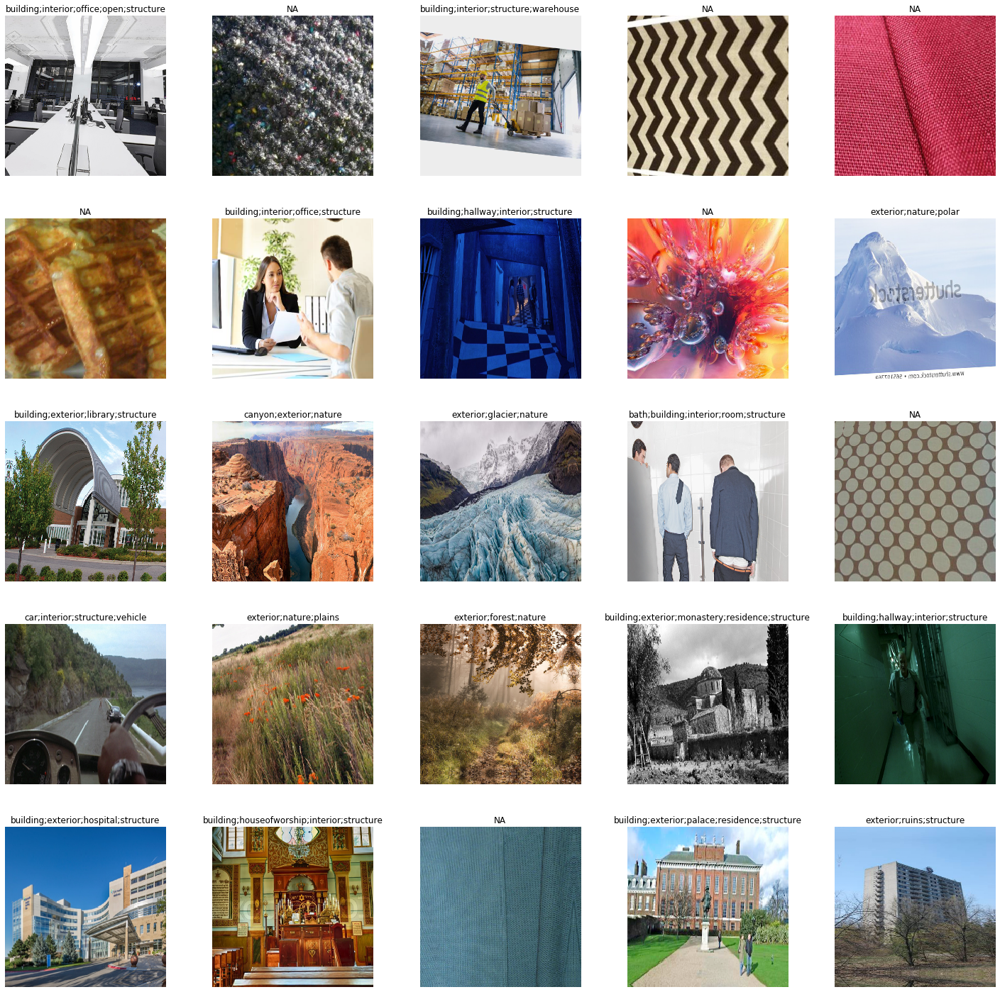

In [28]:
data.show_batch()

## Model Setup

### Architecture, Loss Function, Optimiser

In [30]:
arch = models.mobilenet_v2
#loss_func = LabelSmoothingCrossEntropy()
opt_func  = Ranger

In [31]:
metrics = [accuracy_thresh, FBeta()]

def get_callbacks(learner, mod_name, monitor='accuracy'):
    return [
        #SaveModelCallback(learner, name=mod_name, monitor=monitor),
        CSVLogger        (learner, filename=f'{mod_name}-history'),
        WandbCallback    (learner, monitor=monitor, input_type='images',
                          log='all', predictions=100)
    ]

### Data Augmentations

`CutMix` is generally known to give better performance than `MixUp` (tentative), but this can be contextual.

Intuitively, `CutMix` is a good choice here, since you don't need to see the entire image to classify it. In the case of `shot_framing`, `MixUp` would be a better choice

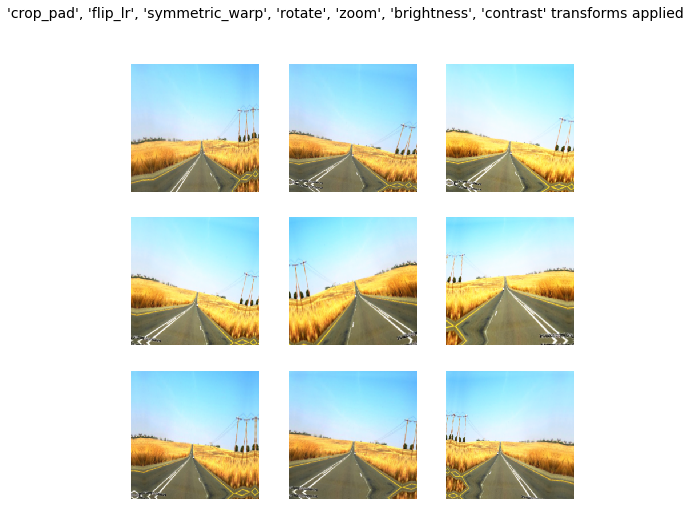

In [31]:
_ = Learner(data,arch()).cutmix().show_tfms()

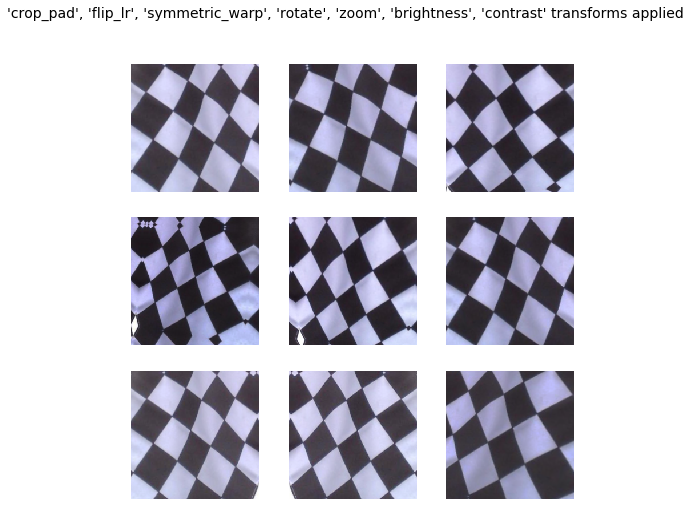

In [32]:
_ = Learner(data,arch()).mixup().show_tfms()

It looks like additional work is needed to apply `MixUp` or `CutMix` to multi label classification. For now, we'll just skip applying these. <br> The ones shown above are the `tfms` transforms.


### Model

## Training

### Model setup -- CNN, metrics, callbacks

I don't fully understand the `thresh` parameter for the metrics functions; I've just copy-pasted best practices from `fastai`'s multi label example.

For evaluating the models, we should rely more on the `fbeta` metric + manually inspect results on new images

In [32]:
learn = cnn_learner(data, arch,
                    metrics=[partial(accuracy_thresh,thresh=0.2), 
                             partial(fbeta, thresh=0.2)])
                    ##opt_func=opt_func, wd=1e-2)
                    #loss_func=loss_func)
#learn = learn.cutmix()

In [33]:
learn.path
learn.path = Path('/home/rahul/datasets/Synopsis_Model_All_Concepts/shot_location/')
learn.path

PosixPath('/')

PosixPath('/home/rahul/datasets/Synopsis_Model_All_Concepts/shot_location')

In [34]:
model_name
model_name = f'{model_name}-w/NA-opt_adam-fixed_lr'
model_name

'cat_shot-location_MNetV2-224x224_tfr-lrn_ATTRIBUTES'

'cat_shot-location_MNetV2-224x224_tfr-lrn_ATTRIBUTES-w/NA-opt_adam-fixed_lr'

In [36]:
learn.opt_func
learn.metrics
learn.loss_func

functools.partial(<class 'torch.optim.adam.Adam'>, betas=(0.9, 0.99))

[functools.partial(<function accuracy_thresh at 0x7fcf8cb7e0e0>, thresh=0.2),
 functools.partial(<function fbeta at 0x7fd07cb23e60>, thresh=0.2)]

FlattenedLoss of BCEWithLogitsLoss()

In [37]:
callbacks = get_callbacks(learn, model_name, monitor='fbeta')

### Fixed `lr` with `adam`

Based on previous experience with training on this dataset (not documented, unfortunately), a fixed learning rate should work well. Benchmark to beat if `fbeta = 0.85`

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.042656,0.033575,0.987352,0.808471,02:29
1,0.034995,0.028544,0.988262,0.839027,02:31
2,0.032596,0.026718,0.988959,0.850206,02:36
3,0.030441,0.025553,0.989757,0.863311,02:33
4,0.030450,0.026230,0.988443,0.845999,02:40
5,0.029933,0.024672,0.989651,0.861951,02:47
6,0.028551,0.024218,0.989975,0.865945,02:43
7,0.028850,0.023991,0.989820,0.870936,02:24
8,0.027705,0.022767,0.990205,0.877335,02:30
9,0.027466,0.023261,0.990602,0.873857,02:26


wandb: Wandb version 0.8.25 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


Better model found at epoch 0 with fbeta value: 0.8084705471992493.


Better model found at epoch 1 with fbeta value: 0.8390265703201294.


Better model found at epoch 2 with fbeta value: 0.8502063155174255.


Better model found at epoch 3 with fbeta value: 0.863310694694519.


Better model found at epoch 6 with fbeta value: 0.8659447431564331.


Better model found at epoch 7 with fbeta value: 0.8709362149238586.


Better model found at epoch 8 with fbeta value: 0.8773348927497864.


Loaded best saved model from /home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200209_152526-1u612b7k/bestmodel.pth


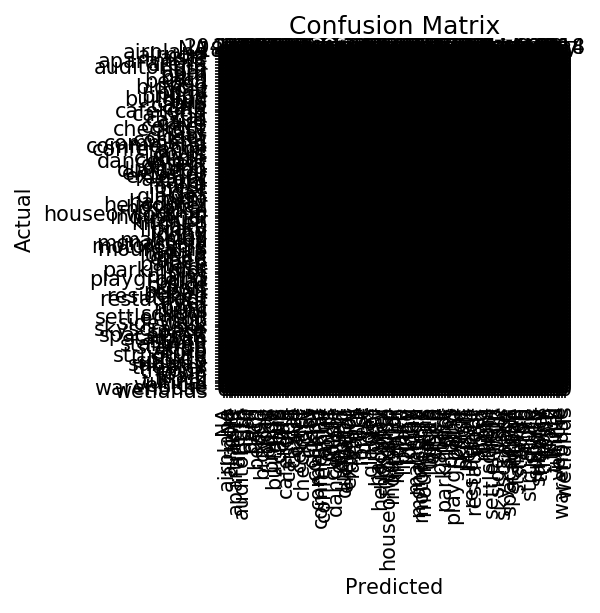

In [38]:
learn.fit(10, 2e-3, wd=1e-2, callbacks=callbacks)

In [35]:
model_name
model_name = re.sub('/', '_', model_name)
model_name

'cat_shot-location_MNetV2-224x224_tfr-lrn_ATTRIBUTES-w/NA-opt_adam-fixed_lr'

'cat_shot-location_MNetV2-224x224_tfr-lrn_ATTRIBUTES-w_NA-opt_adam-fixed_lr'

In [36]:
learn.load(model_name);

In [37]:
model_name
model_name = f'{model_name}-extended'

'cat_shot-location_MNetV2-224x224_tfr-lrn_ATTRIBUTES-w_NA-opt_adam-fixed_lr'

In [46]:
callbacks = get_callbacks(learn, model_name, monitor='fbeta')

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.024956,0.021157,0.991114,0.886515,02:19
1,0.024298,0.020622,0.991280,0.891177,02:07
2,0.023954,0.020842,0.991204,0.888173,02:06
3,0.023266,0.020487,0.991246,0.891839,02:05
4,0.023341,0.020708,0.991406,0.887925,02:06
5,0.022752,0.020152,0.991626,0.894453,02:14
6,0.022666,0.020225,0.991913,0.894657,02:19
7,0.022695,0.020115,0.992016,0.892928,02:15
8,0.022075,0.019646,0.991641,0.895221,02:22
9,0.022273,0.019733,0.991851,0.895105,02:24


wandb: Wandb version 0.8.25 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


Better model found at epoch 0 with fbeta value: 0.8865149021148682.


Better model found at epoch 1 with fbeta value: 0.8911771178245544.


Better model found at epoch 3 with fbeta value: 0.8918386697769165.


Better model found at epoch 5 with fbeta value: 0.8944534063339233.


Better model found at epoch 6 with fbeta value: 0.8946574330329895.


Better model found at epoch 8 with fbeta value: 0.8952205181121826.


Better model found at epoch 10 with fbeta value: 0.8989394307136536.


Better model found at epoch 13 with fbeta value: 0.8990631699562073.


Better model found at epoch 14 with fbeta value: 0.89914470911026.


Loaded best saved model from /home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200209_162439-1u612b7k/bestmodel.pth


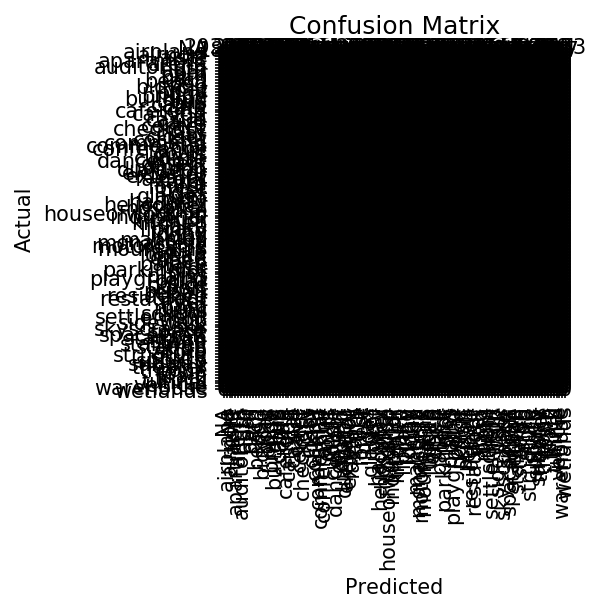

In [39]:
learn.fit(15, 1e-3, wd=1e-2, callbacks=callbacks)

In [42]:
# replace first run model since this is better
learn.save(re.sub('-extended', '', model_name))

In [40]:
learn.load(re.sub('-extended', '', model_name));

### One Cycle

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 2.75E-06
Min loss divided by 10: 3.02E-04


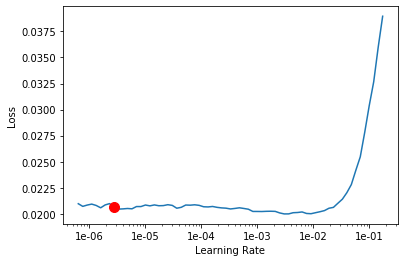

In [44]:
learn.lr_find(wd=1e-2)
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy_thresh,fbeta,time
0,0.020017,0.018804,0.992236,0.903478,02:33
1,0.020050,0.018942,0.992549,0.901448,04:16
2,0.020024,0.018607,0.992463,0.903652,04:54
3,0.019178,0.018633,0.992436,0.904060,04:52
4,0.018040,0.018262,0.992313,0.905854,03:20


Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.8.25 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


Better model found at epoch 0 with fbeta value: 0.9034783840179443.


Better model found at epoch 2 with fbeta value: 0.9036518931388855.


Better model found at epoch 3 with fbeta value: 0.9040601849555969.


Better model found at epoch 4 with fbeta value: 0.9058538675308228.


Loaded best saved model from /home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200209_174107-1u612b7k/bestmodel.pth


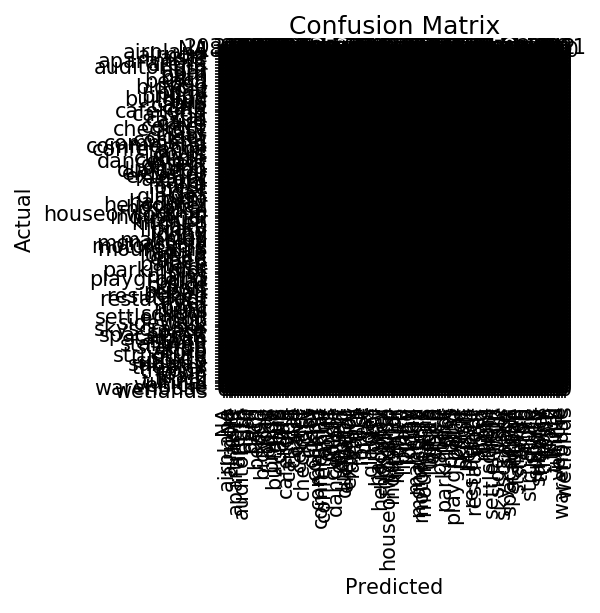

In [47]:
learn.fit_one_cycle(5, slice(1e-6,1e-3), wd=1e-2, callbacks=callbacks)

In [48]:
# replace first run model since this is better
learn.save(re.sub('-extended', '', model_name))

## Interpretation

In [49]:
interpret = learn.interpret()

143 misclassified samples over 11115 samples in the validation set.


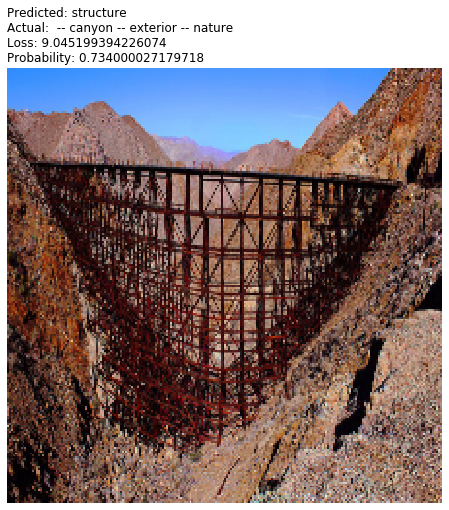

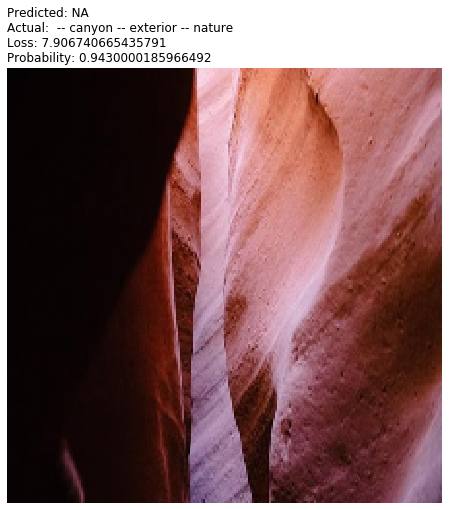

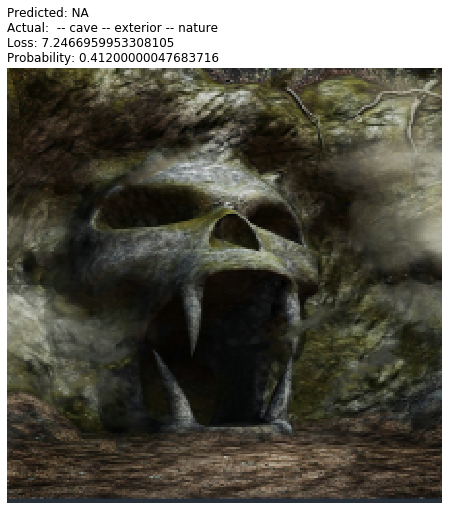

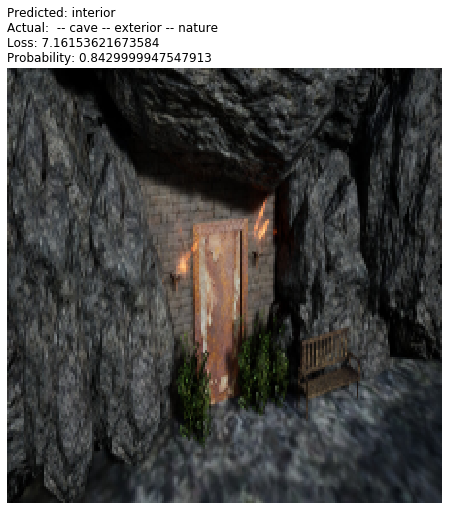

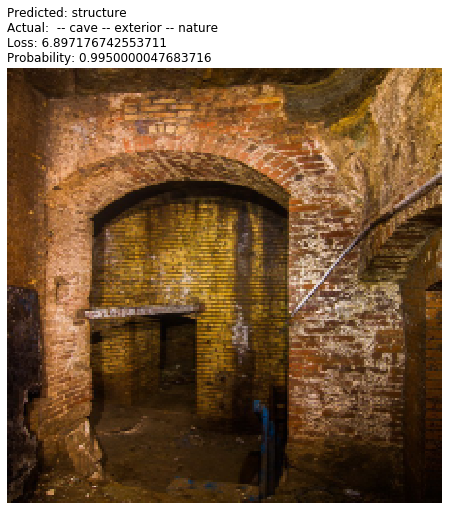

In [50]:
interpret.plot_multi_top_losses(5)

In [56]:
x,y = next(iter(learn.data.valid_dl))

In [59]:
y

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')

In [58]:
y.shape

torch.Size([64, 117])

In [ ]:
interpret.plot_multi_top_losses()

In [51]:
interpret.most_confused()

[('NA', 'structure', 597394),
 ('NA', 'exterior', 352033),
 ('NA', 'interior', 44165),
 ('NA', 'nature', 25562),
 ('airplane', 'structure', 23057),
 ('NA', 'building', 12043),
 ('airplane', 'exterior', 10901),
 ('NA', 'cave', 5934),
 ('NA', 'vehicle', 4861),
 ('airplane', 'NA', 1806),
 ('airplane', 'interior', 1699),
 ('NA', 'playground', 1482),
 ('NA', 'bicycle', 1130),
 ('NA', 'spacecraft', 1020),
 ('NA', 'boat', 1017),
 ('NA', 'desert', 912),
 ('NA', 'car', 791),
 ('NA', 'forest', 684),
 ('NA', 'stairwell', 681),
 ('airplane', 'nature', 646),
 ('NA', 'canyon', 570),
 ('NA', 'elevator', 565),
 ('airplane', 'building', 476),
 ('NA', 'sky', 456),
 ('NA', 'bath', 448),
 ('NA', 'bed', 448),
 ('NA', 'closet', 448),
 ('NA', 'ocean', 342),
 ('NA', 'settlement', 342),
 ('NA', 'tunnel', 342),
 ('NA', 'barn', 339),
 ('NA', 'motorcycle', 339),
 ('NA', 'aisle', 336),
 ('NA', 'space', 232),
 ('NA', 'pier', 228),
 ('NA', 'suburb', 228),
 ('NA', 'helicopter', 226),
 ('NA', 'prison', 226),
 ('NA', '

In [72]:
learn.data.classes

['airplane',
 'airport',
 'aisle',
 'apartment',
 'arena',
 'auditorium',
 'auto',
 'bar',
 'barn',
 'bath',
 'beach',
 'bed',
 'bicycle',
 'boat',
 'body',
 'bridge',
 'building',
 'bus',
 'cabin',
 'cafe',
 'cafeteria',
 'canyon',
 'car',
 'castle',
 'cave',
 'center',
 'checkout',
 'city',
 'class',
 'closet',
 'cockpit',
 'command',
 'commercial',
 'conference',
 'court',
 'crypt',
 'cubicle',
 'dancefloor',
 'desert',
 'dining',
 'dungeon',
 'elevator',
 'exterior',
 'factory',
 'farm',
 'fire',
 'forest',
 'foyer',
 'gas',
 'glacier',
 'gym',
 'hallway',
 'helicopter',
 'hospital',
 'house',
 'houseofworship',
 'industrial',
 'interior',
 'kitchen',
 'lake',
 'library',
 'living',
 'lobby',
 'mall',
 'mansion',
 'monastery',
 'motorcycle',
 'mountains',
 'nature',
 'ocean',
 'office',
 'open',
 'palace',
 'park',
 'parkinglot',
 'pier',
 'plains',
 'playground',
 'polar',
 'police',
 'port',
 'prison',
 'repair',
 'residence',
 'restaurant',
 'river',
 'road',
 'room',
 'ruins',


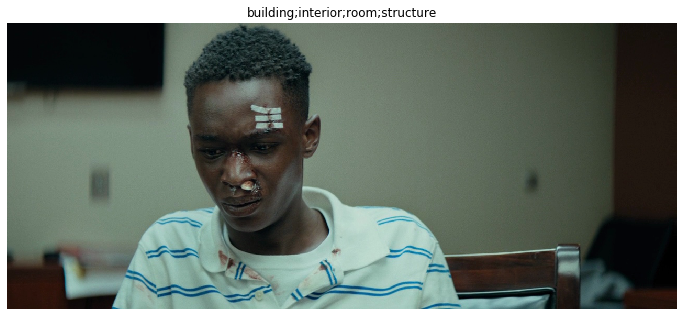

In [98]:
img.show(figsize=(12,8), title=str(preds))

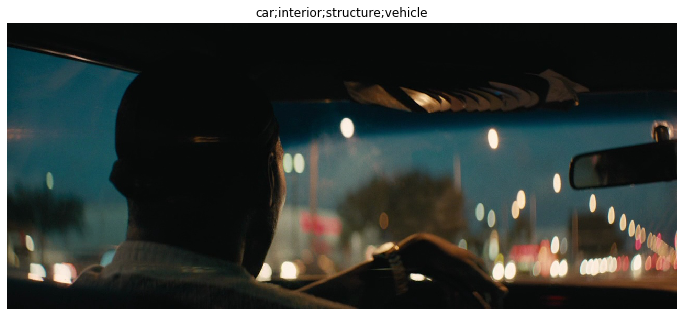

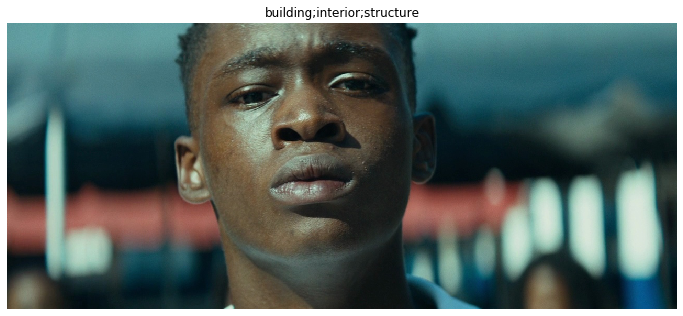

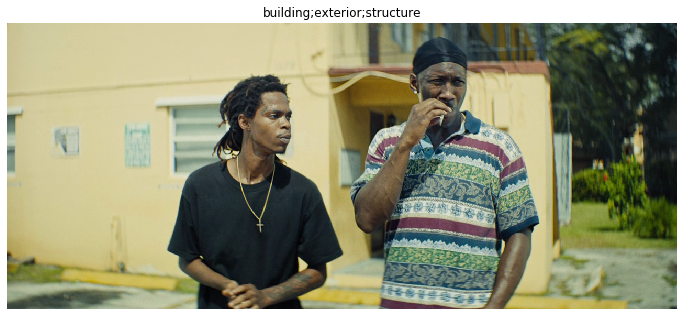

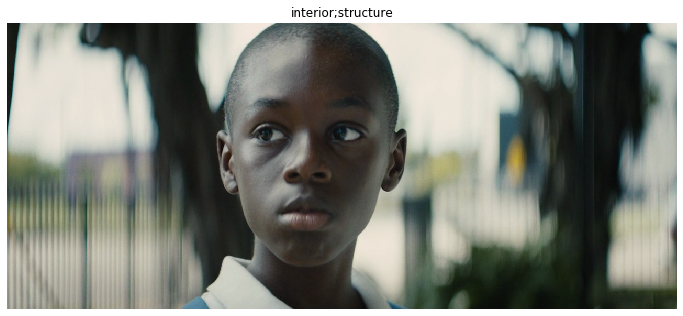

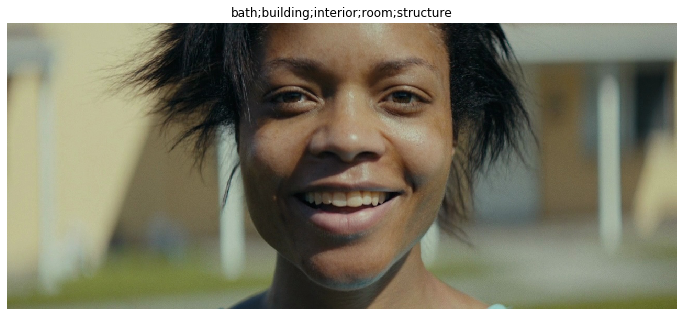

...

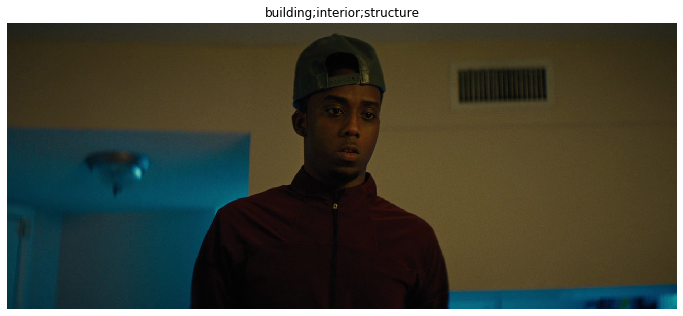

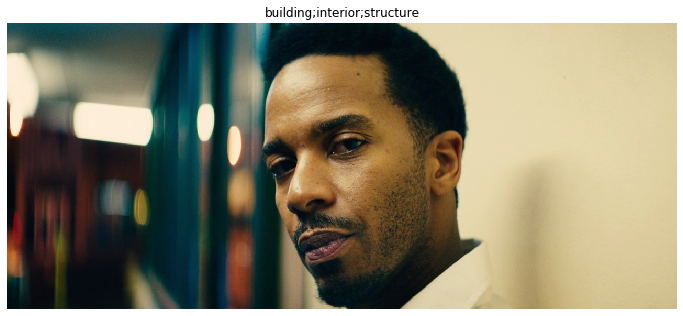

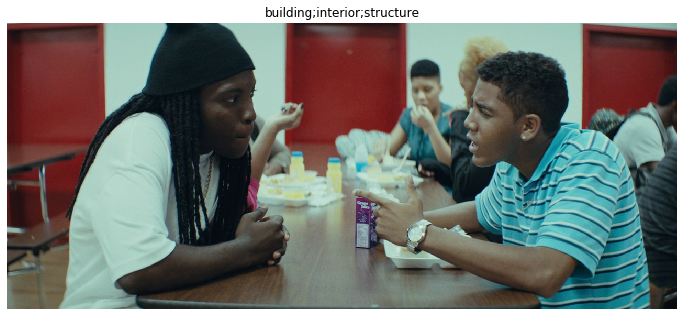

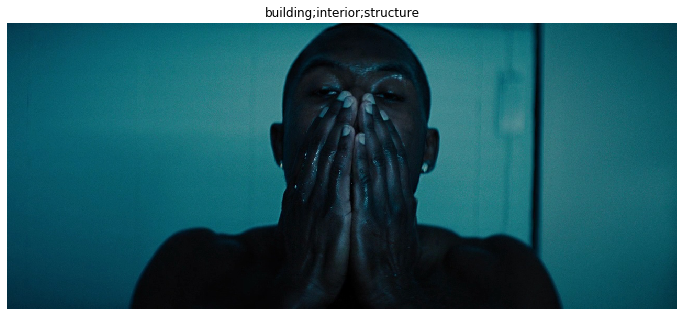

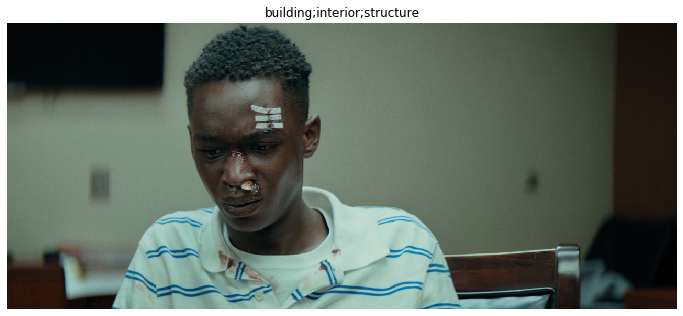

In [64]:
test_path = Path('../filmgrab/moonlight/')
for f in test_path.ls()[50:]:
    #img = 
    img   = open_image(f)
    preds = learn.predict(img)[0]
    img.show(figsize=(12,8), title=str(preds))
    

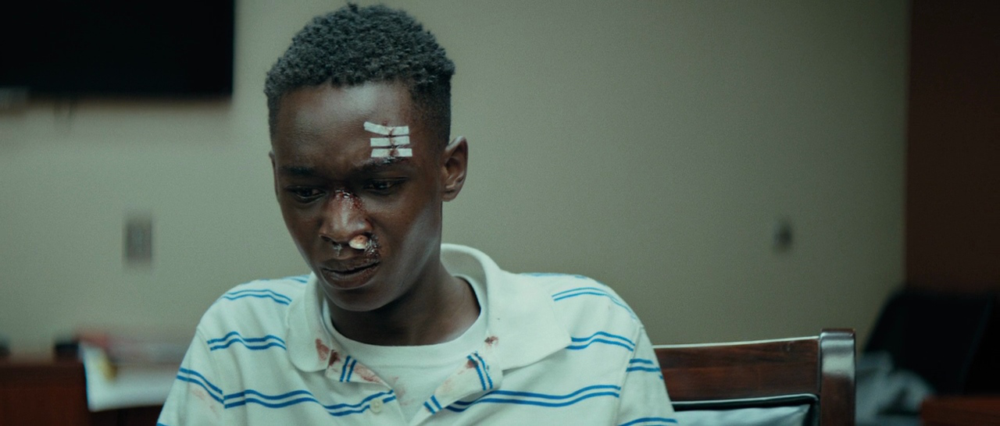

'building;interior;structure'

In [66]:
img
str(preds)

In [81]:
from PIL import Image as Img # Image is a `fastai` datatype 
from PIL import ImageDraw, ImageFont

In [92]:
text = [str.capitalize(s) for s in str(preds).split(';')]
text = ', '.join(text)
text

'Building, Interior, Structure'

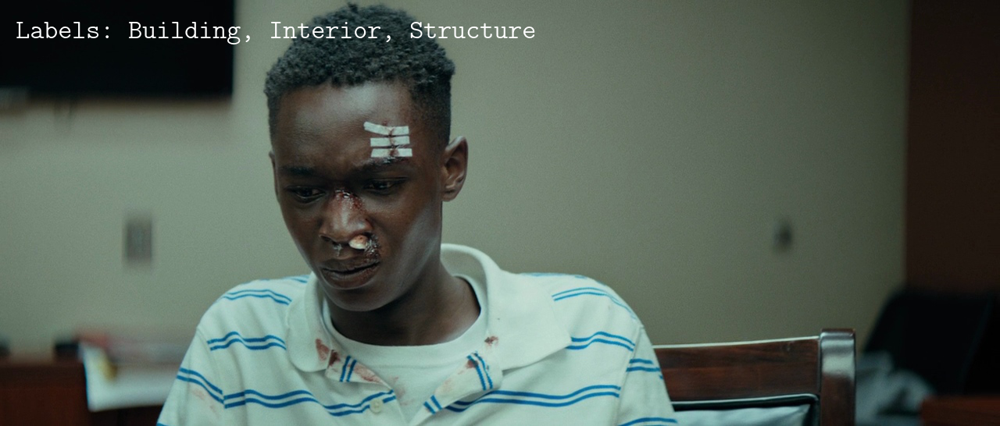

In [110]:
img = Img.open(f)
draw = ImageDraw.Draw(img)
font = ImageFont.truetype('/home/rahul/.jupyter/custom/fonts/cmu-mono/CMUTypewriter-Light.otf',
                          size=35)
(x,y) = (20,20)
text = [str.capitalize(s) for s in str(preds).split(';')]
text = ', '.join(text)
text = 'Labels: ' + text
color = 'rgb(255, 255, 255)' # white
draw.text((x, y), text, fill=color, font=font)

img

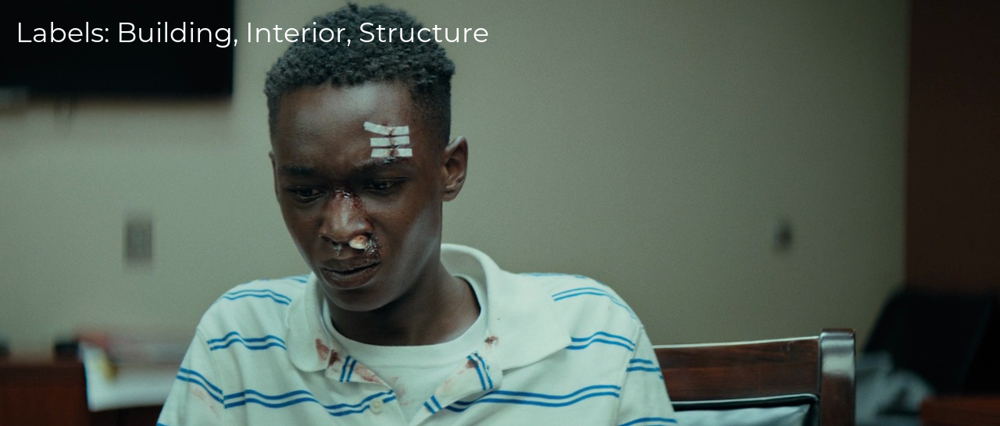

In [101]:
res = Img.open(f)
draw = ImageDraw.Draw(res)
font = ImageFont.truetype('/home/rahul/.jupyter/custom/fonts/Montserrat-Regular.otf',
                          size=35)
(x,y) = (20,20)
text = [str.capitalize(s) for s in str(preds).split(';')]
text = ', '.join(text)
text = 'Labels: ' + text
color = 'rgb(255, 255, 255)' # white
draw.text((x, y), text, fill=color, font=font)

res

In [115]:
type(preds)

fastai.core.MultiCategory

In [119]:
fastai.core.Category??

In [131]:
x = Path('/home/rahul/github_projects/CinemaNet/valid/Extreme Wide/chaplin_456.jpg')
x.

PosixPath('/home/rahul/github_projects/CinemaNet/valid/Extreme Wide')

In [144]:
f
ext   = f.parts[-1].split('.')[-1]
fname = f.parts[-1].split('.')[0]
fname, ext

PosixPath('../filmgrab/moonlight/moonlight_37.jpg')

('moonlight_37', 'jpg')

In [147]:
suffix    = '-suffix'
save_path = Path('/home/rahul/Desktop/')

save_path/f"{fname}{suffix}.{ext}"

PosixPath('/home/rahul/Desktop/moonlight_37-suffix.jpg')

In [151]:
f.parent

PosixPath('../filmgrab/moonlight')

In [220]:
from typing import Union, Optional
import fastai

def label_img(input_path:Union[str, Path],
              preds:Union[fastai.core.Category, fastai.core.MultiCategory],
              return_img=True,
              save=False,
              save_path: Union[str, Path, None] = None,
              suffix:str = '-shot_location_labels',
              xy:tuple   = (20,20),
              font_path  = '/home/rahul/.jupyter/custom/fonts/cmu-mono/CMUTypewriter-Light.otf',
              font_size  = 35,
              text_color='rgb(255, 255, 255)', #white
              border=True,
              border_color='black',
              border_thickness:Union['thin', 'thick']='thick'):
    
    img  = Img.open(input_path).convert('RGB')
    draw = ImageDraw.Draw(img)
    font = ImageFont.truetype(font_path, font_size)
    
    if isinstance(preds, fastai.core.MultiCategory):
        text = [str.capitalize(s) for s in str(preds).split(';')]
        text = ', '.join(text)
    else:
        text = str.capitalize(str(preds))
    text = 'Labels: ' + text
    
    x,y = xy
    if border:
        if border_thickness == 'thin':
            draw.text((x-1, y), text, font=font, fill=border_color)
            draw.text((x+1, y), text, font=font, fill=border_color)
            draw.text((x, y-1), text, font=font, fill=border_color)
            draw.text((x, y+1), text, font=font, fill=border_color)
        if border_thickness == 'thick':
            draw.text((x-1, y-1), text, font=font, fill=border_color)
            draw.text((x+1, y-1), text, font=font, fill=border_color)
            draw.text((x-1, y+1), text, font=font, fill=border_color)
            draw.text((x+1, y+1), text, font=font, fill=border_color)
    
    draw.text((x, y), text, fill=text_color, font=font)
    
    if save:
        ext   = input_path.parts[-1].split('.')[-1]
        fname = input_path.parts[-1].split('.')[0]
        if save_path:
            if isinstance(save_path, str): save_path = Path(save_path)
            img.save(save_path/f'{fname}{suffix}.{ext}')
        else:
            input_path.parts[-1]
            if isinstance(save_path, str): save_path = Path(save_path)
            img.save(input_path.parent/f'{fname}{suffix}.{ext}')
    
    if return_img: return img
    



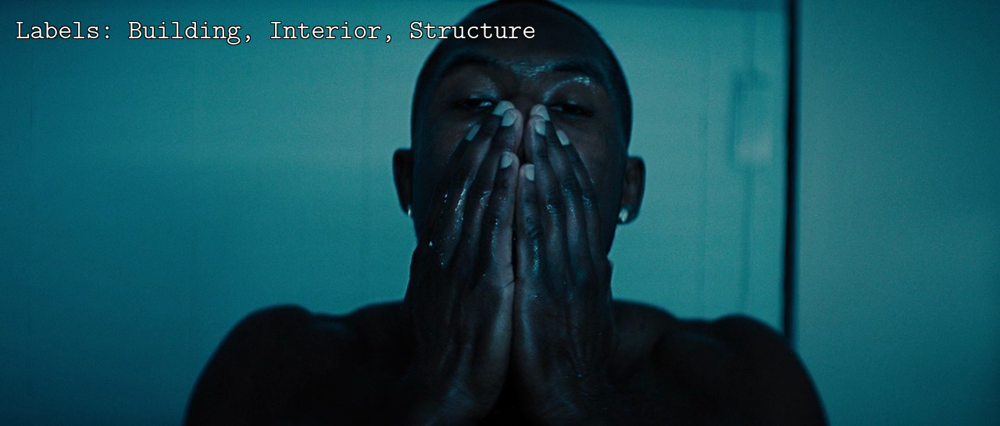

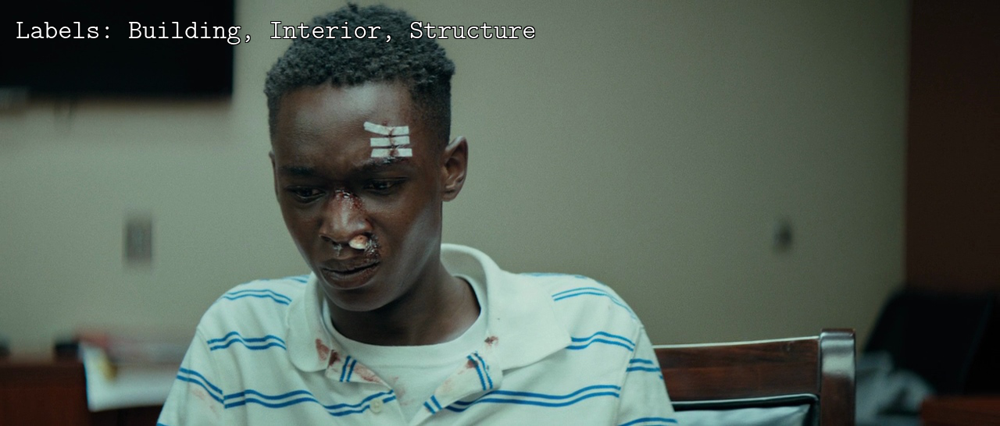

In [200]:
test_path = Path('../filmgrab/moonlight/')
for f in test_path.ls()[-2:]:
    preds = learn.predict(open_image(f))[0]
    label_img(f, preds, save=True, save_path='/home/rahul/Desktop/tmp2/')

Test on 145 hand-picked images and save results to disk

In [225]:
test_path = Path('/home/rahul/Desktop/shot-location-test/')
for f in os.listdir(test_path):
    preds = learn.predict(open_image(test_path/f))[0]
    label_img(test_path/f, preds, save=True,
              save_path = '/home/rahul/Desktop/shot-location-test-results',
              return_img=False)

## Heatmaps

In [357]:
learn = learn.to_fp32()
x,y = data.valid_ds[0]

m = learn.model.eval();

def show_heatmap(hm, path=None, only_heatmap=False, 
                 interpolation='bilinear', alpha=0.5,
                 figsize=(8,5)):
    _,ax = plt.subplots(figsize=figsize)

    plt.gca().set_axis_off()
    plt.gca().xaxis.set_major_locator(NullLocator())
    plt.gca().yaxis.set_major_locator(NullLocator())

    if not only_heatmap: xb_im.show(ax)
    ax.imshow(hm, alpha=alpha, extent=(0,666,375,0),
              interpolation=interpolation, cmap='YlOrRd');
    fname = f'{str(y)}_{str(idx+1)}_heatmap.png'
    if path is not None:
        plt.savefig(path/fname, bbox_inches = 'tight', pad_inches = 0, dpi=800)

    plt.close()
    plt.close('all')

def save_img(img, path, figsize=(8,5), return_path=True):
    img.show(figsize=figsize)

    plt.gca().set_axis_off()
    plt.gca().xaxis.set_major_locator(NullLocator())
    plt.gca().yaxis.set_major_locator(NullLocator())


    fname = f'{str(y)}_{str(idx+1)}.png'
    plt.savefig(path/fname, bbox_inches = 'tight', pad_inches = 0, dpi=800)

    plt.close()
    plt.close('all')
    
    if return_path=True: return path/fname
    
def hooked_backward(cat:Union[fastai.core.Category, fastai.core.MultiCategory]=y):
    import fastai
    # m[0] is the feature extractor
    with hook_output(m[0]) as hook_a:
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            if isinstance(cat, fastai.core.MultiCategory):
                preds[0, cat.data].sum().backward()
            else:
                preds[0,int(cat)].backward()
    return hook_a,hook_g, preds, cat

In [358]:
from shutil import rmtree
from fastai.callbacks.hooks import *
from matplotlib.ticker import NullLocator

In [359]:
path_img = '/home/rahul/Desktop/shot-location-test/'
path_hms = '/home/rahul/Desktop/shot-location-heatmaps/'

path_img = Path(path_img)
path_hms = Path(path_hms)

files = [f for f in os.listdir(path_img) if f.endswith(('.jpg', '.jpeg', '.png'))]

# creating the required directories where needed
# a dummy `ImageDataBunch` needs to be created to generate heatmaps
if path_hms is not None:
    os.mkdir(path_hms) if not os.path.exists(path_hms) else None

os.mkdir(path_img/'train') if not os.path.exists(path_img/'train') else None
os.mkdir(path_img/'train'/'img') if not os.path.exists(path_img/'train'/'img') else None

# move from base dir to dummy train dir
[os.rename(path_img/file, path_img/'train'/'img'/file) for file in files];

# dummy `ImageDataBunch`
temp = ImageDataBunch.from_folder(path_img, 'train', size = (375, 666), ds_tfms = None, bs=1,
                                  resize_method = ResizeMethod.SQUISH, no_check=True,
                                  num_workers = 0
                                 ).normalize(imagenet_stats)

[]

/home/rahul/fastai/fastai/data_block.py:457: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")


In [365]:
cat

MultiCategory exterior;nature;beach

In [366]:
label_img??

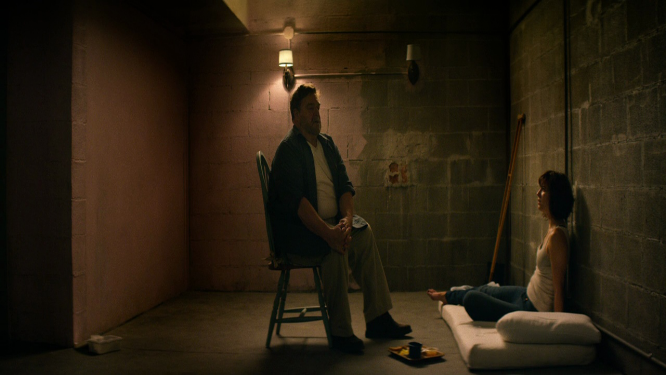

In [372]:
x

In [363]:
label_img('/home/rahul/Desktop/')

torch.Size([1, 117])

In [361]:
# heatmap generation
for idx in range(len(temp.train_ds)):
#for idx in range(1):
    x,y = temp.train_ds[idx]
    print(f'# {idx+1} / {len(temp.train_ds)}')
    #x.show(title = str(temp.valid_ds.y[idx]), figsize = (8, 5))
    xb = temp.one_item(x)[0]
    if torch.cuda.is_available(): xb = xb.cuda()
    xb_im = Image(temp.denorm(xb)[0])
    hook_a,hook_g, preds, cat = hooked_backward()
    acts  = hook_a.stored[0].cpu()
    avg_acts = acts.mean(0)
    
    save_img(x, path_hms)
    show_heatmap(avg_acts, path_hms,
                 only_heatmap=False, interpolation='spline16', 
                 alpha=0.65)


# # deleting dummy directories and moving back files to where they were
# [os.rename(path_img/'train'/'img'/file, path_img/file) for file in files];
# rmtree(path_img/'train')

# 1 / 145
# 2 / 145
# 3 / 145
# 4 / 145
# 5 / 145
# 6 / 145
# 7 / 145
# 8 / 145
# 9 / 145
# 10 / 145
# 11 / 145
# 12 / 145
# 13 / 145
# 14 / 145
# 15 / 145
# 16 / 145
# 17 / 145
# 18 / 145
# 19 / 145
# 20 / 145
# 21 / 145
# 22 / 145
# 23 / 145
# 24 / 145
# 25 / 145
# 26 / 145
# 27 / 145
# 28 / 145
# 29 / 145
# 30 / 145
# 31 / 145
# 32 / 145
# 33 / 145
# 34 / 145
# 35 / 145
# 36 / 145
# 37 / 145
# 38 / 145
# 39 / 145
# 40 / 145
# 41 / 145
# 42 / 145
# 43 / 145
# 44 / 145
# 45 / 145
# 46 / 145
# 47 / 145
# 48 / 145
# 49 / 145
# 50 / 145
# 51 / 145
# 52 / 145
# 53 / 145
# 54 / 145
# 55 / 145
# 56 / 145
# 57 / 145
# 58 / 145
# 59 / 145
# 60 / 145
# 61 / 145
# 62 / 145
# 63 / 145
# 64 / 145
# 65 / 145
# 66 / 145
# 67 / 145
# 68 / 145
# 69 / 145
# 70 / 145
# 71 / 145
# 72 / 145
# 73 / 145
# 74 / 145
# 75 / 145
# 76 / 145
# 77 / 145
# 78 / 145
# 79 / 145
# 80 / 145
# 81 / 145
# 82 / 145
# 83 / 145
# 84 / 145
# 85 / 145
# 86 / 145
# 87 / 145
# 88 / 145
# 89 / 145
# 90 / 145
# 91 / 145
# 92 / 1

## Rename Files & Save to Weights & Biases

In [ ]:
model_name

'cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal'

In [ ]:
learn.load(model_name); # this is just a sanity check, out callbacks would have loaded the best model anyways

set state called


In [ ]:
f'{model_name}-FULL'
f'{model_name}-HEAD'

'cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-FULL'

'cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-HEAD'

In [ ]:
learn.model[1]

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): Flatten()
  (2): BatchNorm1d(2560, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=2560, out_features=512, bias=True)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=4, bias=True)
)

In [ ]:
torch_to_coreml(learn.model, data.c, model_fname=f'{model_name}-FULL')

1/162: Converting Node Type Conv
2/162: Converting Node Type BatchNormalization
3/162: Converting Node Type Clip
4/162: Converting Node Type Conv
5/162: Converting Node Type BatchNormalization
6/162: Converting Node Type Clip
7/162: Converting Node Type Conv
8/162: Converting Node Type BatchNormalization
9/162: Converting Node Type Conv
10/162: Converting Node Type BatchNormalization
11/162: Converting Node Type Clip
12/162: Converting Node Type Conv
13/162: Converting Node Type BatchNormalization
14/162: Converting Node Type Clip
15/162: Converting Node Type Conv
16/162: Converting Node Type BatchNormalization
17/162: Converting Node Type Conv
18/162: Converting Node Type BatchNormalization
19/162: Converting Node Type Clip
20/162: Converting Node Type Conv
21/162: Converting Node Type BatchNormalization
22/162: Converting Node Type Clip
23/162: Converting Node Type Conv
24/162: Converting Node Type BatchNormalization
25/162: Converting Node Type Add
26/162: Converting Node Type Conv


In [ ]:
!ls -l ../exported-models/{model_name}*

-rw-rw-r-- 1 rahul rahul 14342744 Feb  8 19:22 ../exported-models/cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-FULL.mlmodel
-rw-rw-r-- 1 rahul rahul 14353213 Feb  8 19:22 ../exported-models/cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-FULL.onnx


In [ ]:
wandb.save(f'../exported-models/{model_name}*')

wandb: Wandb version 0.8.25 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


['/home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200208_131136-vq35euh5/cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-FULL.onnx',
 '/home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200208_131136-vq35euh5/cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-FULL.mlmodel']

In [ ]:
!ls {learn.path}/{model_name}*csv

/home/rahul/datasets/Synopsis_Model_All_Concepts/color_saturation/cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-history.csv


In [ ]:
wandb.save(f'{learn.path}/{model_name}*csv')

wandb: Wandb version 0.8.25 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


['/home/rahul/github_projects/CinemaNet/nbs/wandb/run-20200208_131136-vq35euh5/cat_color-saturation_MNetV2-150x266_tfr-lrn-opt_ranger-cosine_anneal-history.csv']